# Estimating Parking Cost and Spatial Autocorrelation Analysis of Parking Data

Goals:
   1. Join csv cost data with spatial data for parking lots
   2. Make maps to show data
   3. Estimate Ratios of M to D, D to H, M to H to estimate missing rates values.
   4. Global and Local Spatial Autocorrelation (Moran's I and Getis-Ord Gi*)
       - If Local Spatial Autocorrelation found - attempt interpolation methodologies:
           - Kriging
           - IDW

       - If Local Spatial Autocorrelation is not found - summarize estimated parking lot rates according to areal polygons:
           - "Districts"
           - Drawn Areal Polygons

For future: https://www.inflationtool.com/us-dollar/2010-to-present-value    

Sources:
- https://notebook.community/ocefpaf/folium/examples/Colormaps
- https://nbviewer.org/github/FloChehab/folium/blob/fix_choropleth/examples/GeoJSON_and_choropleth.ipynb
- https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explore.html
- https://geopandas.org/en/stable/docs/user_guide/interactive_mapping.html
- https://gdal.org/programs/gdal_grid.html#interpolation-algorithms
- https://github.com/pysal/esda/tree/master/esda
- https://geographicdata.science/book/notebooks/04_spatial_weights.html

In [68]:
import geopandas as gpd
import pandas as pd
import numpy as np
import pysal
from esda.getisord import G_Local #spatial autocorrelation
from sklearn.gaussian_process import GaussianProcessRegressor #kriging
from osgeo import ogr #delauney triangles and IDW interpolation
import folium # interactive mapping
import branca.colormap as cm # for interactive mapping
import osmnx as ox
import networkx as nx
import copy
import libpysal as lps
from libpysal import weights
from libpysal.weights.util import full2W
from libpysal.weights.util import WSP
from esda.moran import Moran #spatial autocorrelation
from esda.moran import Moran_Local
import scipy
from splot.esda import moran_scatterplot
from splot.esda import plot_moran

## Bring In Data

1. Lot Rates
2. Lot Points
3. Join Points and Rates
4. Filter Lots (must have at least one rate)
5. TAZs
6. Attraction Districts
7. Merge and Dissolve TAZs to Attraction Districts

In [2]:
# bring in data
base = "J:\Shared drives\TMD_TSA\Data\Parking\WebScraped_ParkingCost"
# parking costs
rates = pd.read_csv(base+"\parking_cost_fullrec_NAP_F16.csv")

# spatial points
points = gpd.read_file(base+"\GeocodedParkingLots\DKedits_parking_cost_fullrec_NAP.shp")
points = points.dropna(subset=["geometry"])

# join cost to points
lots = points[['IN_SingleL','geometry','USER_month','USER_lot_u']].merge(rates[['IN_SingleLine','USER_lot_url', 'MR','DR','HR']],
                                                                         left_on='USER_lot_u',right_on='USER_lot_url')
# drop lots of columns
# reproject for easier mapping (From mass state plane to wgs84)
lots = lots.to_crs("EPSG:4326")

# filter out customer only parking (no rates for any category)
lots = lots[(~lots['MR'].isna()) | (~lots['DR'].isna()) | (~lots['HR'].isna())]

In [3]:
# bring in relevant TAZs
base2 = "J:\Shared drives\TMD_TSA\Data\GIS Data\TAZ"
alltazs = gpd.read_file(base2+"\\candidate_CTPS_TAZ_STATEWIDE_2019_wgs84.shp")
# filter to just relevant municipalities
districts = alltazs[(alltazs['town'].isin(["BOSTON","CAMBRIDGE","SOMERVILLE","BROOKLINE","NEWTON"])) & (alltazs['id'] < 200000)][["id","town","geometry"]]

# bring in TAZ to attraction districts table
base3 = "J:\Shared drives\TMD_TSA\Data\GIS Data\\trip_attr_districts"
tazdists = pd.read_csv(base3+"\\taz_attr_dist_at.csv")

# join the district names to the tazs by id
districts = districts.merge(tazdists, on = "id")
# dissolve taz to districts                       
districts = districts.dissolve(by="attr_dist")
districts

,geometry,id,town,at_3level
attr_dist,,,,
"Allston, Dense","POLYGON ((-71.13443 42.34666, -71.13455 42.346...",234,BOSTON,Dense
"Allston, Urban","MULTIPOLYGON (((-71.13110 42.35614, -71.13098 ...",238,BOSTON,Urban
"Area 2/MIT, Dense","POLYGON ((-71.10432 42.35241, -71.10601 42.352...",645,CAMBRIDGE,Dense
"Assembly Square, Dense","POLYGON ((-71.08170 42.39008, -71.08208 42.390...",594,SOMERVILLE,Dense
"Assembly Square, Urban","POLYGON ((-71.07767 42.38699, -71.07804 42.387...",593,SOMERVILLE,Urban
...,...,...,...,...
"West End, Dense","POLYGON ((-71.05997 42.36301, -71.06055 42.362...",24,BOSTON,Dense
"West Roxbury, Suburban","POLYGON ((-71.19042 42.28160, -71.19051 42.281...",447,BOSTON,Suburban
"West Roxbury, Urban","POLYGON ((-71.16687 42.26179, -71.16687 42.261...",436,BOSTON,Urban


In [4]:
lots

,IN_SingleL,geometry,USER_month,USER_lot_u,IN_SingleLine,USER_lot_url,MR,DR,HR
0,"208 Friend St Boston, MA 02114, US",POINT (-71.06078 42.36407),Mon-Fri: 6am-12am,https://www.parkme.com/lot/15284,"208 Friend St Boston, MA 02114, US",https://www.parkme.com/lot/15284,NaN,25.0,10.0
1,"21 Lancaster St Boston, MA 02114, US",POINT (-71.06214 42.36409),Mon-Fri: 6am-12am,https://www.parkme.com/lot/15286,"21 Lancaster St Boston, MA 02114, US",https://www.parkme.com/lot/15286,NaN,25.0,10.0
2,"28 Ash St Boston, MA 02111, US",POINT (-71.06336 42.34869),Mon-Sun: 24 Hours,https://www.parkme.com/lot/32124,"28 Ash St Boston, MA 02111, US",https://www.parkme.com/lot/32124,NaN,23.0,10.0
3,"33 Essex St Boston, MA 02111, US",POINT (-71.05591 42.35267),Mon-Fri: 6am-2am,https://www.parkme.com/lot/15268,"33 Essex St Boston, MA 02111, US",https://www.parkme.com/lot/15268,NaN,30.0,10.0
4,"47 Lagrange St Boston, MA 02116, US",POINT (-71.06409 42.35172),Mon-Sun: 24 Hours,https://www.parkme.com/lot/24171,"47 Lagrange St Boston, MA 02116, US",https://www.parkme.com/lot/24171,NaN,25.0,10.0
...,...,...,...,...,...,...,...,...,...
459,"Yankee Division Hwy Newton, MA 02462, US",POINT (-71.25504 42.33067),Mon-Sun: 24 Hours,https://www.parkme.com/lot/340721,"Yankee Division Hwy Newton, MA 02462, US",https://www.parkme.com/lot/340721,NaN,NaN,0.0
460,"98-100 Winchester St Newton, MA 02461, US",POINT (-71.20863 42.31668),None,https://www.parkme.com/lot/1183409,"98-100 Winchester St Newton, MA 02461, US",https://www.parkme.com/lot/1183409,NaN,NaN,0.0
461,"612 Washington St Newton, MA 02458, US",POINT (-71.19844 42.35386),None,https://www.parkme.com/lot/1183400,"612 Washington St Newton, MA 02458, US",https://www.parkme.com/lot/1183400,NaN,NaN,0.0
462,"591 Moody St Waltham, MA 02453, US",POINT (-71.23836 42.36615),None,https://www.parkme.com/lot/1184561,"591 Moody St Waltham, MA 02453, US",https://www.parkme.com/lot/1184561,NaN,NaN,0.0


## MAPS - Parking Lot Rate Visualization Section

Types of maps in this section:
1. Parking lot rates per time period
2. Average per district (Boston neighborhoods, Brookline, Newton, Somerville, Cambridge)

Each type of map created for each rate type: Monthly, Daily, Hourly

### Map Type 1 - Points

In [9]:
# FUNCTION TO CREATE MAPS for each type of rate: Monthly, Daily, Hourly

def dist_maps(rate, rate_long):
    rplt= districts.explore(color="white", #geopandas connection with folium (leaflet) make map, make polys white
                         legend=True,name="districts", #create legend and call this layer "districts" in layer control
                         tiles="CartoDB dark_matter") #base map 
    lots.explore(m=rplt,column=rate,legend=True, #add points to map, symbolize on "HR", add legend (hidden because black)
                 name=rate_long,#name for layer control
                 tooltip=["IN_SingleLine","USER_lot_url","HR","DR","MR"]) #control what shown on hover
    folium.LayerControl().add_to(rplt) # add layer control
    return rplt

In [10]:
#MAPS 1 - Hourly
hrplt = dist_maps("HR", "Hourly Rates")
hrplt

In [11]:
#MAPS 1 - Daily
drplt = dist_maps("DR", "Daily Rates")
drplt

In [12]:
#MAPS 1 - Monthly
mrplt = dist_maps("MR", "Monthly Rates")
mrplt

### Calculate Mean & Median Rates per District
This is to aggregate data per district instead of at the point level.

In [13]:
# spatial join - for every lot get district
lotdist = lots.sjoin(districts.reset_index(), how="left")
# group by and get mean, median, mode for each rate column
hrmean = lotdist.groupby('attr_dist')['HR'].mean().rename("Hourly_Rate_Mean")
hrmed = lotdist.groupby('attr_dist')['HR'].median().rename("Hourly_Rate_Median")

drmean = lotdist.groupby('attr_dist')['DR'].mean().rename("Daily_Rate_Mean")
drmed = lotdist.groupby('attr_dist')['DR'].median().rename("Daily_Rate_Median")

mrmean = lotdist.groupby('attr_dist')['MR'].mean().rename("Monthly_Rate_Mean")
mrmed = lotdist.groupby('attr_dist')['MR'].median().rename("Monthly_Rate_Median")

# turn geoseries into table
ratesdist = pd.concat([hrmean, hrmed, drmean, drmed, mrmean, mrmed], axis=1)
ratesdistgeo = districts.merge(ratesdist, on = "attr_dist").reset_index()
ratesdistgeo.head()

,attr_dist,geometry,id,town,at_3level,Hourly_Rate_Mean,Hourly_Rate_Median,Daily_Rate_Mean,Daily_Rate_Median,Monthly_Rate_Mean,Monthly_Rate_Median
0,"Allston, Dense","POLYGON ((-71.13443 42.34666, -71.13455 42.346...",234,BOSTON,Dense,0.250000,0.0,17.000000,17.0,158.333333,150.0
1,"Area 2/MIT, Dense","POLYGON ((-71.10432 42.35241, -71.10601 42.352...",645,CAMBRIDGE,Dense,6.750000,6.0,33.666667,34.0,NaN,NaN
2,"Assembly Square, Dense","POLYGON ((-71.08170 42.39008, -71.08208 42.390...",594,SOMERVILLE,Dense,0.333333,0.0,25.000000,25.0,NaN,NaN
3,"Assembly Square, Urban","POLYGON ((-71.07767 42.38699, -71.07804 42.387...",593,SOMERVILLE,Urban,0.000000,0.0,NaN,NaN,NaN,NaN
4,"BROOKLINE, Dense","POLYGON ((-71.13129 42.33177, -71.13140 42.331...",739,BROOKLINE,Dense,4.666667,6.0,30.000000,30.0,195.000000,200.0


### Map Type 2 - Districts

In [15]:
# Mapping Function for Districts

def agg_maps(mean, cmp_mean, median, cmp_median):
    rplt2 = ratesdistgeo.dropna(subset=[mean]).explore(column = mean,
                              legend=True,name=mean,
                              tiles="CartoDB positron",
                              cmap=cmp_mean,
                              style_kwds = dict(fillOpacity=1,opacity=1,color="grey"))
    ratesdistgeo.dropna(subset=[median]).explore(m=rplt2, column=median,
                         name=median,
                         cmap=cmp_median,
                         style_kwds = dict(fillOpacity=1,opacity=1,color="grey"))
    folium.LayerControl().add_to(rplt2) # add layer control
    return rplt2

In [19]:
#MAPS 2 - Hourly

cmp_median = cm.linear.YlOrRd_05.to_step(5).scale(
    ratesdistgeo.Hourly_Rate_Median.min(),
    ratesdistgeo.Hourly_Rate_Median.max())
cmp_mean = cm.linear.YlOrRd_05.to_step(5).scale(
    ratesdistgeo.Hourly_Rate_Mean.min(),
    ratesdistgeo.Hourly_Rate_Mean.max())

hrplt2 = agg_maps("Hourly_Rate_Mean", cmp_mean, "Hourly_Rate_Median", cmp_median)
hrplt2

In [20]:
#MAPS 2 - Daily

cmp_median = cm.linear.RdPu_07.to_step(5).scale(
    ratesdistgeo.Daily_Rate_Median.min(),
    ratesdistgeo.Daily_Rate_Median.max())


drplt2 = agg_maps("Daily_Rate_Mean", cmp_median, "Daily_Rate_Median", cmp_median)
drplt2

In [21]:
#MAPS 2 - Monthly
cmp_mean = cm.linear.Paired_03.to_step(5).scale(
    ratesdistgeo.Monthly_Rate_Mean.min(),
    ratesdistgeo.Monthly_Rate_Mean.max())


mrplt2 = agg_maps("Monthly_Rate_Mean", cmp_mean, "Monthly_Rate_Median", cmp_mean)
mrplt2

## Estimate and Fill Missing Monthly Rates

Calculate the Monthly/Daily ratio per district by dividing the monthly column by the daily column to get lot level ratios and aggregate to the region. This region-wide ratio is multiplied by each lot's Daily Rate to calculate an estimated monthly rate. At this point, a new column is made where observed monthly rate data unless missing, then estimated monthly rate data is used if existing (aka if lot has a daily rate). 

This will be conducted for M/D, D/H, and M/H - M/D is used as the example for the explanation for ease of understanding.

### Monthly to Daily

In [22]:
#copy from prior section
estmonth = copy.copy(lotdist)
#get ratio at the lot level
estmonth['Monthly_to_Daily'] = estmonth['MR']/estmonth['DR']
estmonth[estmonth['Monthly_to_Daily'] > 0]

,IN_SingleL,geometry,USER_month,USER_lot_u,IN_SingleLine,USER_lot_url,MR,DR,HR,index_right,attr_dist,id,town,at_3level,Monthly_to_Daily
7,"11 Stillings St Boston, MA 02210, US",POINT (-71.04717 42.35030),Monthly: $150-$480,https://www.parkme.com/lot/32201/stillings-gar...,"11 Stillings St Boston, MA 02210, US",https://www.parkme.com/lot/32201/stillings-gar...,480.0,25.0,12.0,64.0,"South Boston Waterfront, Dense",144.0,BOSTON,Dense,19.200000
8,"16 Charles St Boston, MA 02108, US",POINT (-71.06826 42.35432),Monthly: $150-$400,https://www.parkme.com/lot/32172,"16 Charles St Boston, MA 02108, US",https://www.parkme.com/lot/32172,400.0,28.0,10.0,12.0,"Beacon Hill, Dense",30.0,BOSTON,Dense,14.285714
9,"40 Beach St Boston, MA 02111, US",POINT (-71.06159 42.35165),Monthly: $165-$335,https://www.parkme.com/lot/75578/40-beach-st?e...,"40 Beach St Boston, MA 02111, US",https://www.parkme.com/lot/75578/40-beach-st?e...,335.0,28.0,12.0,23.0,"Chinatown, Dense",77.0,BOSTON,Dense,11.964286
12,"660 Washington St Boston, MA 02111, US",POINT (-71.06253 42.35172),Monthly: $335-$395,https://www.parkme.com/lot/15258/660-washingto...,"660 Washington St Boston, MA 02111, US",https://www.parkme.com/lot/15258/660-washingto...,395.0,27.0,13.0,23.0,"Chinatown, Dense",77.0,BOSTON,Dense,14.629630
13,"19 Lancaster St Boston, MA 02114, US",POINT (-71.06214 42.36409),Monthly: $465,https://www.parkme.com/lot/24108,"19 Lancaster St Boston, MA 02114, US",https://www.parkme.com/lot/24108,465.0,25.0,13.0,80.0,"West End, Dense",24.0,BOSTON,Dense,18.600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,"1 Sawyer Rd Waltham, MA 02453, US",POINT (-71.26032 42.36179),Monthly: $70,https://www.parkme.com/lot/215055,"1 Sawyer Rd Waltham, MA 02453, US",https://www.parkme.com/lot/215055,70.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,17.500000
455,"200 Webster St Newton, MA 02466, US",POINT (-71.23432 42.34777),Monthly: $70,https://www.parkme.com/lot/215060,"200 Webster St Newton, MA 02466, US",https://www.parkme.com/lot/215060,70.0,4.0,NaN,53.0,"NEWTON, Urban",1040.0,NEWTON,Urban,17.500000
456,"Auburn St Newton, MA 02466, US",POINT (-71.25122 42.34573),Monthly: $105,https://www.parkme.com/lot/215043,"Auburn St Newton, MA 02466, US",https://www.parkme.com/lot/215043,105.0,6.0,NaN,53.0,"NEWTON, Urban",1040.0,NEWTON,Urban,17.500000
457,"91 Wyman St Newton, MA 02468, US",POINT (-71.23017 42.32636),Monthly: $157.50,https://www.parkme.com/lot/215119,"91 Wyman St Newton, MA 02468, US",https://www.parkme.com/lot/215119,157.5,9.0,NaN,53.0,"NEWTON, Urban",1040.0,NEWTON,Urban,17.500000


In [23]:
estmonth['Monthly_to_Daily'].mean()

14.942536419878438

In [24]:
# estimate monthly from daily and mean regional ratio (using only where both values)
estmonth['Est_Monthly'] = estmonth['DR'] * estmonth['Monthly_to_Daily'].mean()

# combine estimated daily with actual daily where possible
estmonth['Monthly_Rate_wEst'] = np.where(estmonth['MR'].isna(),
                                         estmonth['Est_Monthly'],
                                         estmonth['MR'])

### Daily to Hourly

In [25]:
#get D to H ratio at the lot level
# if divide by 0, just set to 0
estmonth['Daily_to_Hourly'] = np.where(estmonth['HR'] == 0,None,estmonth['DR']/estmonth['HR'])
estmonth[estmonth['Daily_to_Hourly'] > 0]

,IN_SingleL,geometry,USER_month,USER_lot_u,IN_SingleLine,USER_lot_url,MR,DR,HR,index_right,attr_dist,id,town,at_3level,Monthly_to_Daily,Est_Monthly,Monthly_Rate_wEst,Daily_to_Hourly
0,"208 Friend St Boston, MA 02114, US",POINT (-71.06078 42.36407),Mon-Fri: 6am-12am,https://www.parkme.com/lot/15284,"208 Friend St Boston, MA 02114, US",https://www.parkme.com/lot/15284,NaN,25.0,10.0,80.0,"West End, Dense",24.0,BOSTON,Dense,NaN,373.563410,373.563410,2.5
1,"21 Lancaster St Boston, MA 02114, US",POINT (-71.06214 42.36409),Mon-Fri: 6am-12am,https://www.parkme.com/lot/15286,"21 Lancaster St Boston, MA 02114, US",https://www.parkme.com/lot/15286,NaN,25.0,10.0,80.0,"West End, Dense",24.0,BOSTON,Dense,NaN,373.563410,373.563410,2.5
2,"28 Ash St Boston, MA 02111, US",POINT (-71.06336 42.34869),Mon-Sun: 24 Hours,https://www.parkme.com/lot/32124,"28 Ash St Boston, MA 02111, US",https://www.parkme.com/lot/32124,NaN,23.0,10.0,23.0,"Chinatown, Dense",77.0,BOSTON,Dense,NaN,343.678338,343.678338,2.3
3,"33 Essex St Boston, MA 02111, US",POINT (-71.05591 42.35267),Mon-Fri: 6am-2am,https://www.parkme.com/lot/15268,"33 Essex St Boston, MA 02111, US",https://www.parkme.com/lot/15268,NaN,30.0,10.0,27.0,"Downtown, Dense",19.0,BOSTON,Dense,NaN,448.276093,448.276093,3.0
4,"47 Lagrange St Boston, MA 02116, US",POINT (-71.06409 42.35172),Mon-Sun: 24 Hours,https://www.parkme.com/lot/24171,"47 Lagrange St Boston, MA 02116, US",https://www.parkme.com/lot/24171,NaN,25.0,10.0,27.0,"Downtown, Dense",19.0,BOSTON,Dense,NaN,373.563410,373.563410,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430,"45 University Rd Cambridge, MA 02138, US",POINT (-71.12409 42.37260),Monthly: $205-$455,https://www.parkme.com/lot/53525,"45 University Rd Cambridge, MA 02138, US",https://www.parkme.com/lot/53525,455.0,31.0,12.0,78.0,"West Cambridge, Dense",693.0,CAMBRIDGE,Dense,14.677419,463.218629,455.000000,2.583333
437,"88 Exeter St Boston, MA 02116, US",POINT (-71.07882 42.34861),Mon-Sun: 24 Hours,https://www.parkme.com/lot/188670,"88 Exeter St Boston, MA 02116, US",https://www.parkme.com/lot/188670,NaN,44.0,9.0,8.0,"Back Bay, Dense",94.0,BOSTON,Dense,NaN,657.471602,657.471602,4.888889
438,"210 Columbus Ave Boston, MA 02116, US",POINT (-71.07195 42.34824),Mon-Sun: 24 Hours,https://www.parkme.com/lot/197418,"210 Columbus Ave Boston, MA 02116, US",https://www.parkme.com/lot/197418,NaN,23.0,12.0,8.0,"Back Bay, Dense",94.0,BOSTON,Dense,NaN,343.678338,343.678338,1.916667
439,"35 Exeter St Boston, MA 02116, US",POINT (-71.07999 42.34992),Mon-Sat: 7am-12am,https://www.parkme.com/lot/32166,"35 Exeter St Boston, MA 02116, US",https://www.parkme.com/lot/32166,NaN,38.0,20.0,8.0,"Back Bay, Dense",94.0,BOSTON,Dense,NaN,567.816384,567.816384,1.9


In [26]:
estmonth['Daily_to_Hourly'].mean()

2.933415430151465

In [27]:
# estimate Daily from Hourly and mean regional ratio (using only where both values)
estmonth['Est_Daily'] = estmonth['HR'] * estmonth['Daily_to_Hourly'].mean()

# combine estimated daily with actual daily where possible
estmonth['Daily_Rate_wEst'] = np.where(estmonth['DR'].isna(),
                                         estmonth['Est_Daily'],
                                         estmonth['DR'])

### Monthly to Hourly 
(Derived from Daily to Hourly Ratio and Monthly to Daily Ratio)

In [28]:
#get Monthly to Hourly ratio at the lot level
# if divide by 0, just set to 0
estmonth['Monthly_to_Hourly'] = estmonth['Daily_to_Hourly']*estmonth['Monthly_to_Daily']
estmonth[~estmonth['Monthly_to_Hourly'].isna()]

,IN_SingleL,geometry,USER_month,USER_lot_u,IN_SingleLine,USER_lot_url,MR,DR,HR,index_right,...,id,town,at_3level,Monthly_to_Daily,Est_Monthly,Monthly_Rate_wEst,Daily_to_Hourly,Est_Daily,Daily_Rate_wEst,Monthly_to_Hourly
7,"11 Stillings St Boston, MA 02210, US",POINT (-71.04717 42.35030),Monthly: $150-$480,https://www.parkme.com/lot/32201/stillings-gar...,"11 Stillings St Boston, MA 02210, US",https://www.parkme.com/lot/32201/stillings-gar...,480.0,25.0,12.0,64.0,...,144.0,BOSTON,Dense,19.200000,373.563410,480.0,2.083333,35.200985,25.0,40.0
8,"16 Charles St Boston, MA 02108, US",POINT (-71.06826 42.35432),Monthly: $150-$400,https://www.parkme.com/lot/32172,"16 Charles St Boston, MA 02108, US",https://www.parkme.com/lot/32172,400.0,28.0,10.0,12.0,...,30.0,BOSTON,Dense,14.285714,418.391020,400.0,2.8,29.334154,28.0,40.0
9,"40 Beach St Boston, MA 02111, US",POINT (-71.06159 42.35165),Monthly: $165-$335,https://www.parkme.com/lot/75578/40-beach-st?e...,"40 Beach St Boston, MA 02111, US",https://www.parkme.com/lot/75578/40-beach-st?e...,335.0,28.0,12.0,23.0,...,77.0,BOSTON,Dense,11.964286,418.391020,335.0,2.333333,35.200985,28.0,27.916667
12,"660 Washington St Boston, MA 02111, US",POINT (-71.06253 42.35172),Monthly: $335-$395,https://www.parkme.com/lot/15258/660-washingto...,"660 Washington St Boston, MA 02111, US",https://www.parkme.com/lot/15258/660-washingto...,395.0,27.0,13.0,23.0,...,77.0,BOSTON,Dense,14.629630,403.448483,395.0,2.076923,38.134401,27.0,30.384615
13,"19 Lancaster St Boston, MA 02114, US",POINT (-71.06214 42.36409),Monthly: $465,https://www.parkme.com/lot/24108,"19 Lancaster St Boston, MA 02114, US",https://www.parkme.com/lot/24108,465.0,25.0,13.0,80.0,...,24.0,BOSTON,Dense,18.600000,373.563410,465.0,1.923077,38.134401,25.0,35.769231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337,"720 Harrison Ave Boston, MA 02118, US",POINT (-71.07094 42.33774),Monthly: $300,https://www.parkme.com/lot/32181,"720 Harrison Ave Boston, MA 02118, US",https://www.parkme.com/lot/32181,300.0,40.0,8.0,68.0,...,110.0,BOSTON,Dense,7.500000,597.701457,300.0,5.0,23.467323,40.0,37.5
338,"835 Columbus Ave Boston, MA 02120, US",POINT (-71.08831 42.33630),Monthly: $125-$350,https://www.parkme.com/lot/26200,"835 Columbus Ave Boston, MA 02120, US",https://www.parkme.com/lot/26200,350.0,38.0,12.0,62.0,...,320.0,BOSTON,Dense,9.210526,567.816384,350.0,3.166667,35.200985,38.0,29.166667
347,"720 E Concord St Boston, MA 02118, US",POINT (-71.07079 42.33488),Monthly: $249,https://www.parkme.com/lot/80468,"720 E Concord St Boston, MA 02118, US",https://www.parkme.com/lot/80468,249.0,40.0,8.0,68.0,...,110.0,BOSTON,Dense,6.225000,597.701457,249.0,5.0,23.467323,40.0,31.125
396,"1 Evelyn Pl Malden, MA 02148, US",POINT (-71.07492 42.42821),Monthly: $135-$150,https://www.parkme.com/lot/187380/malden-gatew...,"1 Evelyn Pl Malden, MA 02148, US",https://www.parkme.com/lot/187380/malden-gatew...,150.0,18.0,7.0,NaN,...,NaN,NaN,NaN,8.333333,268.965656,150.0,2.571429,20.533908,18.0,21.428571


In [29]:
estmonth['Monthly_to_Hourly'].mean()

31.92207857493632

In [33]:
# estimate Hourly from Monthly and mean regional ratio (using only where both values)
estmonth['Est_Hourly'] = estmonth['Monthly_to_Hourly'].mean() / estmonth['HR']

# combine estimated daily with actual daily where possible
estmonth['Hourly_Rate_wEst'] = np.where(estmonth['HR'].isna(),
                                         estmonth['Est_Hourly'],
                                         estmonth['HR'])


### SUMMARY STATISTICS FOR RATIO CALCULATIONS

In [31]:
# SUMMARY STATS
#none of these stats include NAs
sumdict = {}
sumdict['Monthly_to_Hourly'] = {'Avg': estmonth['Monthly_to_Hourly'].mean(),'Min': estmonth['Monthly_to_Hourly'].min(),
                               'Max': estmonth['Monthly_to_Hourly'].max(),'std':estmonth['Monthly_to_Hourly'].std(),
                               'Count' : estmonth['Monthly_to_Hourly'].count()}
sumdict['Daily_to_Hourly'] = {'Avg': estmonth['Daily_to_Hourly'].mean(),'Min': estmonth['Daily_to_Hourly'].min(),
                               'Max': estmonth['Daily_to_Hourly'].max(),'std':estmonth['Daily_to_Hourly'].std(),
                               'Count': estmonth['Daily_to_Hourly'].count()}
sumdict['Monthly_to_Daily'] = {'Avg': estmonth['Monthly_to_Daily'].mean(),'Min': estmonth['Monthly_to_Daily'].min(),
                               'Max': estmonth['Monthly_to_Daily'].max(),'std':estmonth['Monthly_to_Daily'].std(),
                               'Count': estmonth['Monthly_to_Daily'].count()}
stats = pd.DataFrame(sumdict)
stats.head()

,Monthly_to_Hourly,Daily_to_Hourly,Monthly_to_Daily
Avg,31.922079,2.933415,14.942536
Min,3.518519,0.821429,2.317073
Max,80.000000,25.000000,27.692308
std,11.962698,2.256365,4.008317
Count,96.000000,180.000000,130.000000


<AxesSubplot:>

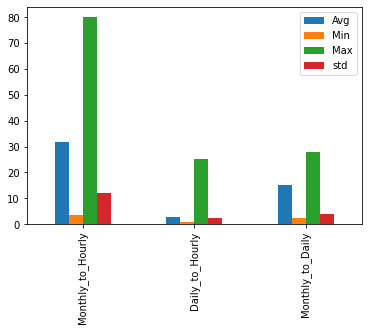

In [32]:
stats.transpose()[['Avg','Min','Max','std']].plot.bar()

## SPATIAL AUTOCORRELATION

1. Moran's I
2. Getis-Ord Gi* (Hot Spot)

- doing global (1) and local (2) spatial autocorrelation (clustering) algorithms for all daily, hourly, monthly, and monthly with estimates rates.


- #### Why am I doing this? 
(https://gisgeography.com/spatial-autocorrelation-moran-i-gis/)
    - TL;DR: Tobler's First Law of Geography ("Everything is related to everything else. But near things are more related than distant things.")
    - "Spatial autocorrelation in GIS helps understand the degree to which one object is similar to other nearby objects." In simple language,"Spatial autocorrelation measures how close [in value] objects are in comparison with other close [over distance] objects."
        - "Positive spatial autocorrelation is when similar values cluster together in a map.
        - Negative spatial autocorrelation is when dissimilar values cluster together in a map."
    - Its not very useful to look at interpolation methods if there is no spatial autocorrelation. The values of pixels in a surface are most accurately interpolated when a pixel has many close neighbors with measured like values. The accuracy will decline as the points get more spread out in relation to the whole dataset and correlated to that, when "near" values get like alikewith less like values especially given that our measured data is not very verbose.
    - If we have 0 or negative global spatial autocorrelation, we will not move forward with interpolation. We will need to have to go back to the data because this would mean that in the case of 0, that the liklihood that points of like values will cluster together is completely random, and if negative, that points of unlike values are likely to be near each other. These conditions make it challenging to estimate nearby values given the pattern is much less straight forward (or is absent in the case of 0).


- #### Makes sense, so why are we doing two types of testing for spatial autocorrelation?
    - Moran's I is global - so if this comes up negative or 0, it doesn't make sense to move forward as this is looking at the dataset as a whole. Moran's I doesn't return an additional information on the point level as it is a global measure. The output is a Z-score and a p-value so the user can assess how far from random (0 standard deviations) the result is. See below: 
    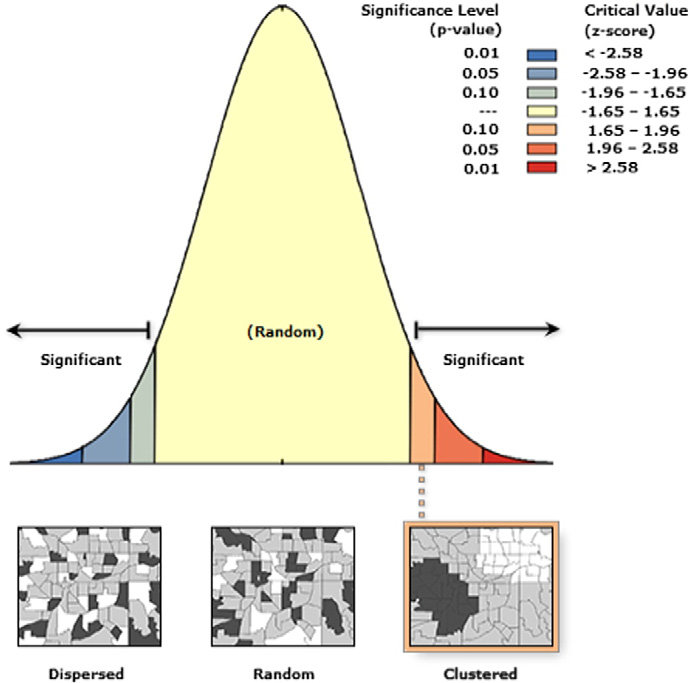
    - However, if Moran's I is positive (meaning we have like values near like values) we know that it is unlikely that this is equally present across the dataset. Some places will have less "neighbors" (near points) and others will have less like values near other like values (possibly an area where if taken alone has 0 or negative or just lower positive spatial autocorrelation?). Additionally, we might want to know where our dataset has clusters of like values in the extremes of our dataset. All of this is addressed by Getis-Ord Gi* which looks at spatial autocorrelation per neighborhood, which is what is meant by "local measure". Points will be labeled with what cluster it is in and whether it is a "hot spot" (high value cluster) or a "cold spot" (low value cluster). This can then be visualized on a map. How hot and cold spots are denoted is by how many standard deviations from the mean the spatial autocorrelation is from random per cluster. 
    
    
#### Moran's I
There are two parts to the Moran's I calculation: 
1. weights (distance based spatial weights)
    - how we define how close points are and therefore neighborhoods
2. values & spatial location (geodataframe)
    - where points are and what the important value is - in this case: parking cost

### Part 1 - Spatial Weights

We are defining how close points are by routing between them (making a skim) instead of using Euclidean Distance. While the impact is likely not huge, the boundary of water features is not included when using Euclidean distance and there are a lot of water features in and around Boston.

    a. Create Graph
    b. Find nearest node on the graph to each lot
    c. Store the relationship between nodes to lots (order is maintained)

C:\Users\matkinson.AD\Anaconda3\envs\geostat\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  This is separate from the ipykernel package so we can avoid doing imports until


id                                                         234
town                                                    BOSTON
at_3level                                                Dense
geometry     POLYGON ((-71.04474055004258 42.29763970273902...
Name: (0, 1), dtype: object
id                                                         234
town                                                    BOSTON
at_3level                                                Dense
geometry     POLYGON ((-71.06741056218544 42.39348471965923...
Name: (0, 3), dtype: object
id                                                         234
town                                                    BOSTON
at_3level                                                Dense
geometry     POLYGON ((-70.9578945218353 42.311429707701066...
Name: (0, 4), dtype: object
id                                                         234
town                                                    BOSTON
at_3level                         

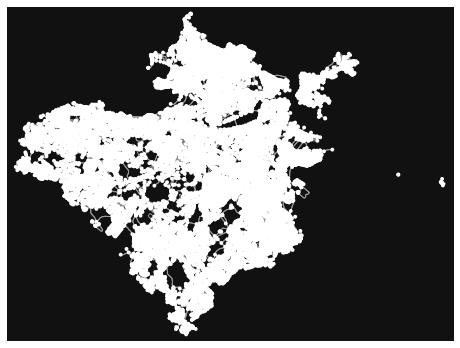

In [34]:
# Create Node/Lot Relationship Table
count = 0
allpoly = districts.dissolve().explode()
for i, row in allpoly.iterrows():
    try:
        net = ox.graph_from_polygon(row['geometry'], network_type='drive')
        if count > 0:
            full_net = nx.compose(full_net, net)
        else:
            full_net = net
        count+=1
    except:
        print(row)
#show graph
ox.plot_graph(full_net)

# reproject lots to match graph (see below)
lots84=estmonth.to_crs('EPSG: 4326')

#project graph to a GCRS as nearest_nodes uses greatest circle for distance and flat planes will give erroneous
full_net84 = ox.project_graph(full_net,to_crs={'proj':'longlat','epsg':'4326'})

# find nearest nodes to parking lots
lot_nodes = ox.nearest_nodes(full_net84, lots84.geometry.x, lots84.geometry.y)

# Create reference dict then table
estmonth['nearest_node'] = lot_nodes

### Create or Import Distance Matrix (skim) and CLean

In [37]:
# Create or Import Distance Matrix (skim)
'''
# USE ONLY IF YOU NEED A NEW DISTANCE MATRIX THIS CAN TAKE A WHILE TO RUN
# Create graph from OSM

# create origin and destination lists (pairs)
blarg = pd.DataFrame(data=None, index=lot_nodes, columns = lot_nodes)

# Create Skim - this takes about 10 hours to run.
for i in blarg.index:
    j = [i]*len(blarg.columns)
    routes = ox.shortest_path(full_net84, j, blarg.columns, weight='length')
    
    blarg[i] = routes
    
blarg

blarg.to_csv("J:\Shared drives\TMD_TSA\Data\Parking\WebScraped_ParkingCost\\routesnodes_mar16.csv")

# We think that the create skim section is fixed but unclear - if not giving distance use:
def fred(x):
    if type(x) == type([]):
        y = sum(ox.utils_graph.get_route_edge_attributes(full_net84,x,"length",'length'))
    else:
        y = x
    return y
skim = blarg.applymap(lambda x: fred(x))
skim
skim.to_csv("J:\Shared drives\TMD_TSA\Data\Parking\WebScraped_ParkingCost\\skim_mar16.csv")
'''


skim = pd.read_csv("J:\Shared drives\TMD_TSA\Data\Parking\WebScraped_ParkingCost\\skim_mar16.csv",index_col= 0 )

In [38]:
# Deal with duplicated columns/index (handled differently, but should be same)
    # Columns take .1, .2 etc suffix, Indices accept duplicates - we would like no duplicates
    # Thankfully in the skim, order should be the same.
skim = skim.set_index(skim.columns)
# Take the Inverse Distance (puts between 0 and 1) - Classic
skim_weighted = 1/skim
# If denominator was 0 (diags), set value = 0
skim_weighted = skim_weighted.applymap(lambda x: 0 if x > 1 else (0 if pd.isna(x) else x))

skim_weighted.to_csv("J:\Shared drives\TMD_TSA\Data\Parking\WebScraped_ParkingCost\\lotskim_weighted_adjusted.csv")
skim_weighted

,61339810,61362200,61371587,61381868,61341689,61471576,61349099,61341290,61353360,61341258,...,67456432,67441522,67435219,1352871016,67455990,3189285908,67491506,67433782,67467286,67534816
61339810,0.000000,0.005715,0.000437,0.000640,0.000497,0.000467,0.000807,0.000476,0.000645,0.000482,...,0.000055,0.000065,0.000059,0.000063,0.000057,0.000054,0.000068,0.000081,0.000063,0.000066
61362200,0.001952,0.000000,0.000434,0.000635,0.000493,0.000464,0.000724,0.000473,0.000640,0.000479,...,0.000056,0.000065,0.000060,0.000063,0.000058,0.000054,0.000069,0.000082,0.000064,0.000066
61371587,0.000386,0.000440,0.000000,0.000978,0.001722,0.002412,0.000379,0.000523,0.000589,0.001952,...,0.000056,0.000065,0.000060,0.000066,0.000058,0.000056,0.000075,0.000082,0.000064,0.000067
61381868,0.000484,0.000637,0.000934,0.000000,0.001259,0.001321,0.000620,0.001123,0.000562,0.001170,...,0.000055,0.000064,0.000059,0.000065,0.000057,0.000055,0.000072,0.000080,0.000063,0.000065
61341689,0.000498,0.000591,0.001000,0.000880,0.000000,0.001158,0.000461,0.000493,0.000809,0.001054,...,0.000058,0.000067,0.000062,0.000068,0.000060,0.000057,0.000076,0.000086,0.000066,0.000069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3189285908,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
67491506,0.000068,0.000069,0.000075,0.000071,0.000075,0.000075,0.000065,0.000067,0.000077,0.000074,...,0.000133,0.000187,0.000158,0.000341,0.000155,0.000173,0.000000,0.000205,0.000151,0.000193
67433782,0.000081,0.000082,0.000085,0.000079,0.000084,0.000083,0.000075,0.000074,0.000089,0.000083,...,0.000175,0.000300,0.000212,0.000207,0.000189,0.000154,0.000205,0.000000,0.000289,0.000355
67467286,0.000063,0.000064,0.000066,0.000062,0.000065,0.000065,0.000060,0.000059,0.000068,0.000064,...,0.000266,0.000399,0.000350,0.000214,0.000273,0.000176,0.000151,0.000289,0.000000,0.000599


### FILTER OUT MISSING DATA

While lots with no parking information were filtered out originally, we have seen above that not all records have all three types of rate data. Moran's I requires that no missing data is input - so for each type of rate we need to filter out NAs and the corresponding paths in the skim.

In [47]:
# make sure the repeated nodes are differentiated (like in skim) (hopefully same order)
estmonth['cols']=skim_weighted.columns

def filter_skim(rates2):
    #for monthly to start - drop NA lots for Monthly by columns and rows
    b = set(pd.Series(skim_weighted.index.astype(str)).tolist())
    c = set(estmonth[estmonth[rates2].isna()]['cols'].astype(str).tolist())

    # drop all columns and rows that involve parking lots with null Monthly rate estimated values
    skim_filtered = skim_weighted.drop(c&b, axis = 0)
    skim_filtered2 = skim_filtered.drop(c&b, axis = 1)
    
    return skim_filtered2


In [50]:
# Monthly Filtered Skim
skim_weighted_monthly = filter_skim("Monthly_Rate_wEst")

# Daily Filtered Skim
skim_weighted_daily = filter_skim("Daily_Rate_wEst")

# Hourly Filtered Skim
skim_weighted_hourly = filter_skim("Hourly_Rate_wEst")

skim_weighted_monthly


,61339810,61362200,61371587,61381868,61341689,61471576,61349099,61341290,61353360,61341258,...,61342432,61341943,61450281,61455275,67541965,67456432,67441522,67435219,1352871016,67455990
61339810,0.000000,0.005715,0.000437,0.000640,0.000497,0.000467,0.000807,0.000476,0.000645,0.000482,...,0.000380,0.000329,0.000227,0.000216,0.000066,0.000055,0.000065,0.000059,0.000063,0.000057
61362200,0.001952,0.000000,0.000434,0.000635,0.000493,0.000464,0.000724,0.000473,0.000640,0.000479,...,0.000378,0.000329,0.000231,0.000219,0.000066,0.000056,0.000065,0.000060,0.000063,0.000058
61371587,0.000386,0.000440,0.000000,0.000978,0.001722,0.002412,0.000379,0.000523,0.000589,0.001952,...,0.001057,0.000546,0.000273,0.000257,0.000067,0.000056,0.000065,0.000060,0.000066,0.000058
61381868,0.000484,0.000637,0.000934,0.000000,0.001259,0.001321,0.000620,0.001123,0.000562,0.001170,...,0.000603,0.000460,0.000250,0.000236,0.000065,0.000055,0.000064,0.000059,0.000065,0.000057
61341689,0.000498,0.000591,0.001000,0.000880,0.000000,0.001158,0.000461,0.000493,0.000809,0.001054,...,0.001048,0.000725,0.000311,0.000290,0.000069,0.000058,0.000067,0.000062,0.000068,0.000060
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67456432,0.000055,0.000056,0.000057,0.000055,0.000057,0.000057,0.000053,0.000052,0.000059,0.000056,...,0.000059,0.000062,0.000070,0.000069,0.000324,0.000000,0.000362,0.000653,0.000197,0.000393
67441522,0.000064,0.000065,0.000066,0.000063,0.000066,0.000065,0.000060,0.000059,0.000068,0.000065,...,0.000069,0.000073,0.000084,0.000082,0.001320,0.000352,0.000000,0.000599,0.000323,0.000445
67435219,0.000058,0.000059,0.000061,0.000058,0.000060,0.000060,0.000055,0.000055,0.000062,0.000059,...,0.000063,0.000066,0.000075,0.000074,0.000463,0.000605,0.000595,0.000000,0.000250,0.000891
1352871016,0.000063,0.000064,0.000066,0.000064,0.000067,0.000066,0.000060,0.000060,0.000070,0.000066,...,0.000070,0.000075,0.000084,0.000083,0.000300,0.000195,0.000327,0.000254,0.000000,0.000281


### Create Spatial Weights Objects (From Skim)

Move through Scipy Sparse Distance Matrix

In [55]:
def make_sw(filtered_weighted_skim):
    '''Create Spatial Weights from Sparse Distance Matrix'''
    sparse = scipy.sparse.csr_matrix(filtered_weighted_skim)
    w = WSP(sparse)
    weights = w.to_W()
    return weights

In [59]:
# Monthly Spatial Weights
monthly_weights = make_sw(skim_weighted_monthly)
# Daily Spatial Weights
daily_weights = make_sw(skim_weighted_daily)
# Hourly Spatial Weights
hourly_weights = make_sw(skim_weighted_hourly)

monthly_weights.full() # show inside of weights and what lots are islands!

C:\Users\matkinson.AD\Anaconda3\envs\geostat\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 210.
  warnings.warn(message)
C:\Users\matkinson.AD\Anaconda3\envs\geostat\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There are 3 islands with ids: 268, 341, 395.
  warnings.warn(message)
C:\Users\matkinson.AD\Anaconda3\envs\geostat\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There are 2 islands with ids: 271, 310.
  warnings.warn(message)


(array([[0.00000000e+00, 5.71487353e-03, 4.36756177e-04, ...,
         5.93087658e-05, 6.30102293e-05, 5.73357937e-05],
        [1.95155461e-03, 0.00000000e+00, 4.34336375e-04, ...,
         5.95714596e-05, 6.33068177e-05, 5.75812644e-05],
        [3.86159577e-04, 4.39762827e-04, 0.00000000e+00, ...,
         6.00184185e-05, 6.60674350e-05, 5.79987530e-05],
        ...,
        [5.83271652e-05, 5.92310495e-05, 6.06813570e-05, ...,
         0.00000000e+00, 2.49934517e-04, 8.90802729e-04],
        [6.28344995e-05, 6.41059584e-05, 6.57342958e-05, ...,
         2.53978123e-04, 0.00000000e+00, 2.80661812e-04],
        [5.64506974e-05, 5.72969368e-05, 5.86529907e-05, ...,
         8.92983915e-04, 3.23962502e-04, 0.00000000e+00]]),
 [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,

## Run Moran's I

As a note - Moran's I does not accept infinite or NA (missing) rates - the column containing estimated rates must be filtered/edited to compensate for these conditions. This filtering has already been done to the spatial weights through filtering of the skim. Due to every index/column name set having the same order, the spatial weight will match up with the order of lots in the rates column.

In [70]:
# Moran's I 
# FYI - Issue with this is that 0 is a real value unlike NA, so need to rid of all NAs (also these points from weights)
# Also - rowsum

# Monthly
mimr = Moran(estmonth['Monthly_Rate_wEst'].round(0).apply(lambda x: 0 if x > 1000 else x).dropna(),  monthly_weights, transformation='r')
# Daily
midr = Moran(estmonth['Daily_Rate_wEst'].round(0).apply(lambda x: 0 if x > 1000 else x).dropna(),  daily_weights, transformation='r')
# Hourly
mihr = Moran(estmonth['Hourly_Rate_wEst'].round(0).apply(lambda x: 0 if x > 1000 else x).dropna(),  hourly_weights, transformation='r')

In [63]:
# Results Table

mitab = pd.DataFrame({'Monthly': {'p_value': mimr.p_norm, 'Z_Score': mimr.z_norm},
                     'Daily': {'p_value': midr.p_norm, 'Z_Score': midr.z_norm},
                     'Hourly': {'p_value': mihr.p_norm, 'Z_Score': mihr.z_norm}})

mitab

,Monthly,Daily,Hourly
p_value,0.00000,0.000000,0.000000
Z_Score,9.96609,14.082639,18.315472


(<Figure size 720x288 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Reference Distribution'}, xlabel='Moran I: 0.16', ylabel='Density'>,
        <AxesSubplot:title={'center':'Moran Scatterplot (0.16)'}, xlabel='Attribute', ylabel='Spatial Lag'>],
       dtype=object))

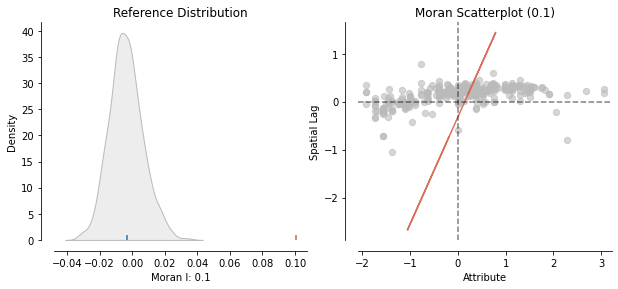

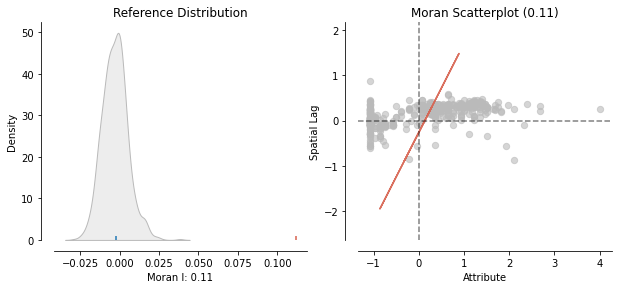

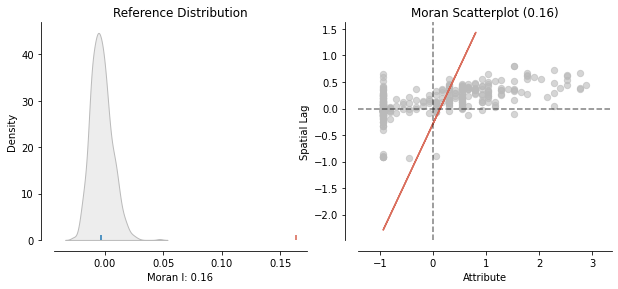

In [66]:
# Visual Summaries of Moran's I Results
plot_moran(mimr, zstandard=True, figsize=(10,4))
plot_moran(midr, zstandard=True, figsize=(10,4))
plot_moran(mihr, zstandard=True, figsize=(10,4))

## What we know so far:

The data is positively spatially autocorrelated - meaning that there is a less than 1% likelihood that this value and spatial clustering pattern was created randomly and that like values are near other like values, globally.

Since we do have positive spatial autocorrelation globally, we can run a local spatial autocorrelation algorithm. In this case - I am using Getis Ord GI* (pronounced Getis Ord GEE EYE STAR), also called Hot-Spot Analysis to see if there are clusters of points with similar values that are either high or low in terms of the range of values. In this algorithm, clusters of 'medium' e.g. value clusters that are not high or low in a statistically significant way. Getis Ord Gi* is (from my experience) the most common local spatial autocorrelation algorithm, but there are more local algorithms that are used than global as Moran's I is a default.

See the following explanation of Getis Ord Gi* from Esri - https://pro.arcgis.com/en/pro-app/2.8/tool-reference/spatial-statistics/h-how-hot-spot-analysis-getis-ord-gi-spatial-stati.htm

"The Hot Spot Analysis tool calculates the Getis-Ord Gi* statistic (pronounced G-i-star) for each feature in a dataset. The resultant z-scores and p-values tell you where features with either high or low values cluster spatially. This tool works by looking at each feature within the context of neighboring features. A feature with a high value is interesting but may not be a statistically significant hot spot. To be a statistically significant hot spot, a feature will have a high value and be surrounded by other features with high values as well. The local sum for a feature and its neighbors is compared proportionally to the sum of all features; when the local sum is very different from the expected local sum, and when that difference is too large to be the result of random chance, a statistically significant z-score results. When the FDR correction is applied, statistical significance is adjusted to account for multiple testing and spatial dependency."

## Results of Local Spatial Autocorrelation

Due to a lack of experience with running spatial autocorrelation in python - Getis Ord Gi* was run in ArcPro with the following specifications:
1. Euclidian Distance measure between points for use in creating spatial weights
2. Use Inverse Distance to turn distance into weights (between 0 and 1)
3. Row Standardization
4. Apply False Discovery Rate Correction (go back and assess if points have been placed in the right clusters)
5. Run on Rate column with estimates for missing values

None of the results for any rates were statistically significant - telling us that while there was clustering globally, the clusters do not necessarily represent Hot or Cold spots. Looking at the data, we can see that while like values are near like values, the values can still move from medium to high (or low) within a cluster; or be a cluster of middle value points. Variation within clusters can make it harder to predict new values nearby (aka interpolate). 

To look into this more, I ran Local Moran's I which does not focus as much on just Hot and Cold (ignoring all other points) - instead, it focuses on what points are part of a high/low value cluster and what points are outliers (e.g. a high value point near low value points). LH outliers are mixed within the HH cluster values downtown to an extent that it is unlikely to be able to interpolate with any consistency within a quite small area. In addition, outside downtown, the data gets much more sparse and interpolation is unlikely to be a method that makes sense given the large gaps in the surface that would be missing.

After talking with Marty, we decided that instead of looking into how we could use Kriging, IDW or another interpolation technique/algorithm to predict nearby values to make a parking lot rate surface, aggregation to areal polygons (TAZs, drawn shapes, districts etc.) would be a better way to turn point data into TAZ level data with estimation.

## EXPERIMENT:
1. LOCAL AUTOCORRELATION!! GETIS ORD GI*

In [67]:
mlg = G_Local(estmonth['Monthly_Rate_wEst'].round(0).apply(lambda x: 0 if x > 1000 else x).dropna(),  monthly_weights, transform='r')

C:\Users\matkinson.AD\Anaconda3\envs\geostat\lib\site-packages\esda\getisord.py:496: RuntimeWarning: invalid value encountered in true_divide
  z_scores = (statistic - expected_value) / np.sqrt(expected_variance)
C:\Users\matkinson.AD\Anaconda3\envs\geostat\lib\site-packages\scipy\stats\_distn_infrastructure.py:1956: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= np.asarray(_b)) & cond0


ValueError: cannot assign slice from input of different size

## EXPERIMENT:
2. LOCAL SPATIAL AUTOCORRELATION - LOCAL MORAN's I

In [71]:
mlimr = Moran_Local(estmonth['Monthly_Rate_wEst'].round(0).apply(lambda x: 0 if x > 1000 else x).dropna(),  monthly_weights, transformation='r', permutations = 499)

ValueError: cannot assign slice from input of different size

In [ ]:
print('p ' + mlimr.p_norm)
print('z ' + mlimr.z_norm)